#### PREDICTING & ANALYSING CONSUMER'S PURCHASING INTENTIONS DURING ONLINE SHOPPING : MANVI BAJPAI

##### Project Description: 

This study aims to draw attention to an area of business and market model that has not yet been fully explored: how consumer perception and behaviour while online shopping affect e-commerce enterprises (in terms of revenue/profit being created, popularity, etc.). 
We'll also watch as these businesses use a variety of analytical approaches to assess and explore in order to understand customer engagement levels, website traffic, revenue production, visitor types, and numerous other factors.

##### Project Findings:

The goals of these machine learning models are twofold:

**Step I:** Examining customer behaviour during a visit and how it affects the business in accordance with the dataset.

**Step II:** Predicting a machine learning model employing different methodologies to determine precise future values on customer online shopping intentions. 

##### Data Set:

Dataset: http://archive.ics.uci.edu/ml/datasets/Online+Shoppers+Purchasing+Intention+Dataset

**Abstract:** The dataset has been downloaded from the UCI Machine Learning Repository. It is to be noted that the available dataset is a subset of the original data as found in the research paper. { https://doi.org/10.1007/s00521-018-3523-0 }

**Given that:**

i) Of the 12,330 sessions in the dataset, 84.5% (10,422) were negative class samples that did not end with shopping, and the rest (1908) were positive class samples ending with shopping.

ii) The dataset was formed so that each session would belong to a different user in a 1-year period to avoid any tendency to a specific campaign, special day, user profile, or period

##### Attribute Information:

**Administrative:** This is the number of pages of this type (administrative) that the user visited.

**Administrative_Duration:** This is the amount of time spent in this category of pages.

**Informational:** This is the number of pages of this type (informational) that the user visited.

**Informational_Duration:** This is the amount of time spent in this category of pages.

**ProductRelated:** This is the number of pages of this type (product related) that the user visited.

**ProductRelated_Duration:** This is the amount of time spent in this category of pages.

**BounceRates:** The percentage of visitors who enter the website through that page and exit without triggering any additional tasks.

**ExitRates:** The percentage of pageviews on the website that end at that specific page.

**PageValues:** The average value of the page averaged over the value of the target page and/or the completion of an eCommerce transaction. <br>

**SpecialDay:** This value represents the closeness of the browsing date to special days or holidays (eg Mother's Day or Valentine's day) in which the transaction is more likely to be finalized. More information about how this value is calculated below.

**Month:** Contains the month the pageview occurred, in string form.

**OperatingSystems:** An integer value representing the operating system that the user was on when viewing the page.

**Browser:** An integer value representing the browser that the user was using to view the page.

**Region:** An integer value representing which region the user is located in.

**TrafficType:** An integer value representing what type of traffic the user is categorized into. <br>

**VisitorType:** A string representing whether a visitor is New Visitor, Returning Visitor, or Other.

**Weekend:** A boolean representing whether the session is on a weekend.

**Revenue:** A boolean representing whether or not the user completed the purchase.

#### Importing Required Libraries for Analysis

In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('ggplot')

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import classification_report

from warnings import filterwarnings
filterwarnings('ignore')

#### Understanding the dataset

In [2]:
os.chdir(r"C:\Users\Hp\OneDrive\Documents\Imarticus PGA 30")

In [3]:
df = pd.read_csv("online_shoppers_intention.csv")

In [4]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [6]:
df.shape

(12330, 18)

In [7]:
# Fixing the data type of 16. Weekend and 17. Revenue from boolean values to binary value 
df.Revenue = df.Revenue.astype('int')
df.Weekend = df.Weekend.astype('int')

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [9]:
df.columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend', 'Revenue'],
      dtype='object')

#### CHECKING DATA FOR NULL AND DUPLICATE VALUES

In [10]:
# Find the presence of any Null Values
df.isnull().sum().sum()

0

In [11]:
# Finding Duplicate Values (if any)
df.duplicated().sum()

125

In [12]:
df.drop_duplicates(inplace=True)

In [13]:
df.shape

(12205, 18)

#### EXPLORATORY DATA ANALYSIS USING PANDAS PROFILING REPORT

**A. Importing panadsprofiling** 

In [14]:
import pandas_profiling as pp
import pandas as pd
from pandas_profiling import ProfileReport
df = pd.read_csv("online_shoppers_intention.csv")
EDAreport = ProfileReport(df)
EDAreport

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**B. Exporting pandasprofiling report for direct html browsing**

In [18]:
import webbrowser
html = "consumer_intention.html"
webbrowser.open(html)

True

### Step I: Examining customer behaviour during a visit and how it affects the business in accordance with the dataset.

#### OUTLIERS

In [16]:
cat_cols=['Administrative','Informational','ProductRelated','Month','OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend', 'SpecialDay']

In [17]:
numerical_columns=['Administrative_Duration','Informational_Duration','ProductRelated_Duration','BounceRates', 'ExitRates', 'PageValues']

In [18]:
# identify outliers with standard deviation
from numpy.random import seed
from numpy.random import randn
from numpy import mean
from numpy import std
out_per=[]
for i in numerical_columns:
    df_mean, df_std = mean(df[i]), std(df[i])
    
    # identify outliers
    cut_off = df_std * 3
    lower, upper = df_mean - cut_off, df_mean + cut_off
    print(i, ': \n')

    # identify outliers
    outliers = [x for x in df[i] if x < lower or x > upper]
    
    num_out = len(outliers)
    print('Identified outliers: %d' %num_out)
    outliers_removed = [x for x in df[i] if x >= lower and x <= upper]
    num_nout = len(outliers_removed)
    print('Non-outlier observations: %d' %num_nout)
    outlier_percent = (num_out / (num_out + num_nout)) * 100
    print('Percent of outliers:', outlier_percent, '\n')
    out_per.append(outlier_percent)

Administrative_Duration : 

Identified outliers: 232
Non-outlier observations: 12098
Percent of outliers: 1.8815896188158963 

Informational_Duration : 

Identified outliers: 230
Non-outlier observations: 12100
Percent of outliers: 1.8653690186536902 

ProductRelated_Duration : 

Identified outliers: 219
Non-outlier observations: 12111
Percent of outliers: 1.7761557177615572 

BounceRates : 

Identified outliers: 708
Non-outlier observations: 11622
Percent of outliers: 5.742092457420925 

ExitRates : 

Identified outliers: 713
Non-outlier observations: 11617
Percent of outliers: 5.78264395782644 

PageValues : 

Identified outliers: 259
Non-outlier observations: 12071
Percent of outliers: 2.1005677210056772 



In [19]:
Outliers = pd.DataFrame({'Variables': numerical_columns, '% Of Outliers': out_per})
outlier_sorted = Outliers.sort_values('% Of Outliers', ascending = False)
outlier_sorted

,Variables,% Of Outliers
4,ExitRates,5.782644
3,BounceRates,5.742092
5,PageValues,2.100568
0,Administrative_Duration,1.881590
1,Informational_Duration,1.865369
2,ProductRelated_Duration,1.776156


The presence of the of outliers are extreme in few cases but a drop in them can lead to data set being imbalanced again hence the outliers less than 1% can be managed and the extreme outlier values has to be noted while modeling.

#### VISUALIZATION OF UNIVARIATE AND BIVARIATE ANALYSIS

**A. REVENUE ANALYSIS**

False    10422
True      1908
Name: Revenue, dtype: int64
False    0.845255
True     0.154745
Name: Revenue, dtype: float64


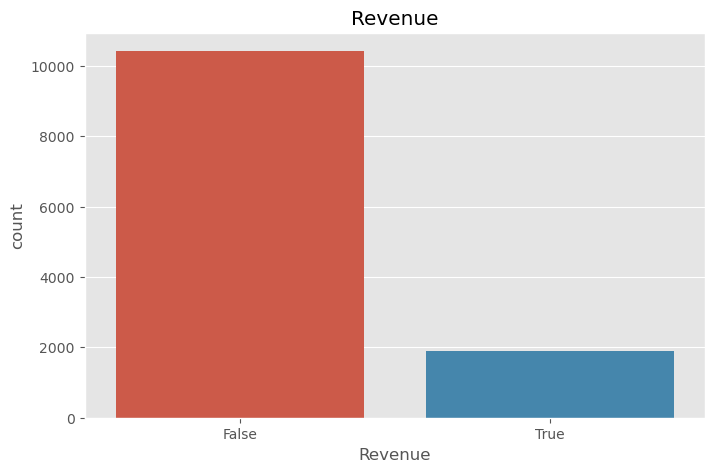

In [24]:
print(df['Revenue'].value_counts())
print(df['Revenue'].value_counts(normalize=True))
sns.countplot(df['Revenue'])
plt.title("Revenue")
plt.show()

**Observation:** For the given year in accordance to the data the revenue generation performance is dissapointing where only around **15.47%** of revenue was accounted in comparison to **84.52%** with no revenue generation.

**B. WEEKEND & WEEKDAYS REVENUE AND VISIT BY CONSUMER ANALYSIS**

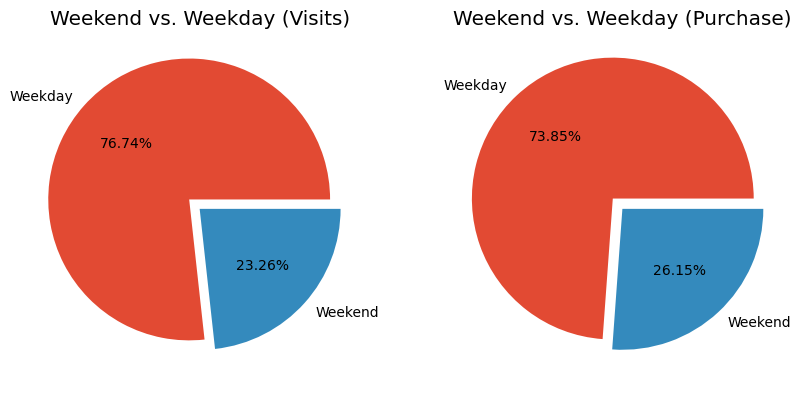

In [25]:
# Weekends and Weekdays: Revenue generation and Visits 

fig, ax = plt.subplots(1, 2,figsize=(10, 5), subplot_kw=dict(aspect="equal"))
ax[0].pie(df['Weekend'].value_counts(),explode=(0.1,0),labels=['Weekday','Weekend'],autopct = '%.2f%%' )
ax[0].set_title('Weekend vs. Weekday (Visits)')
ax[1].pie(df[df['Revenue'] == 1]['Weekend'].value_counts(),explode=(0.1,0),labels=['Weekday','Weekend'], autopct = '%.2f%%')
ax[1].set_title('Weekend vs. Weekday (Purchase)')
plt.show()

**Observation A:** With respect to the weekend and weekday visit of the consumer we can see the illusion of buying more on weekends had been broken with **23.26%** engagement rate in comaprison to weekday engagementof **76.74%**

**Observation B:** With respect to weekend and weekday purchasing activites of the consumer once again in transactions were carried out more on weekdays as of **73.85%** as comapred to weekends **26.15%**.

**C. TRAFFIC TYPE & REVENUE GENERATION**

In [26]:
## creating function for data plots and their analysis

def data_plots(col):
    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    sns.countplot(df[col])
    plt.title(f" Variable: {col}")

    plt.subplot(1,2,2)
    sns.countplot(df[col], hue=df['Revenue'])
    plt.title(f"Analysing: {col} VS Revenue")
    plt.show()

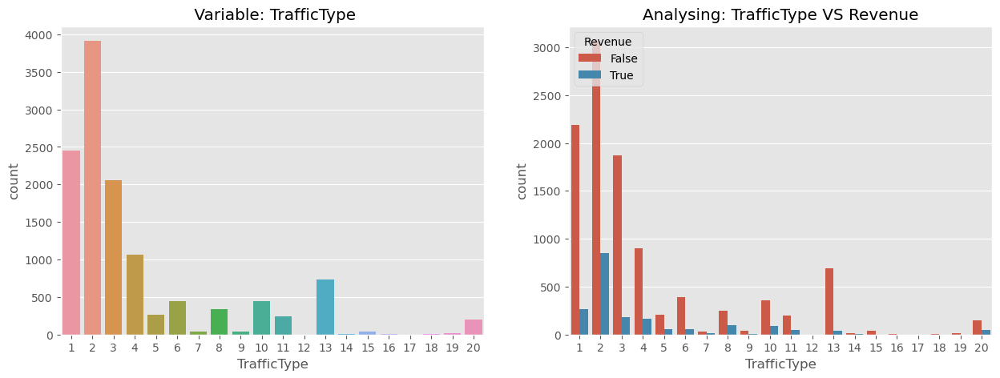

In [27]:
data_plots('TrafficType')

**Observation A:** Maximum Traffic Generated = Types 1, 2, 3, 4, and 13 
Compared to other traffic categories, Traffic Type 2 has generally made a bigger contribution to revenue production. 

**Observation B:** Zero Traffic Generated = Types 12, 15, 17, and 18

**D. REGION AND REVENUE ANALYSIS**

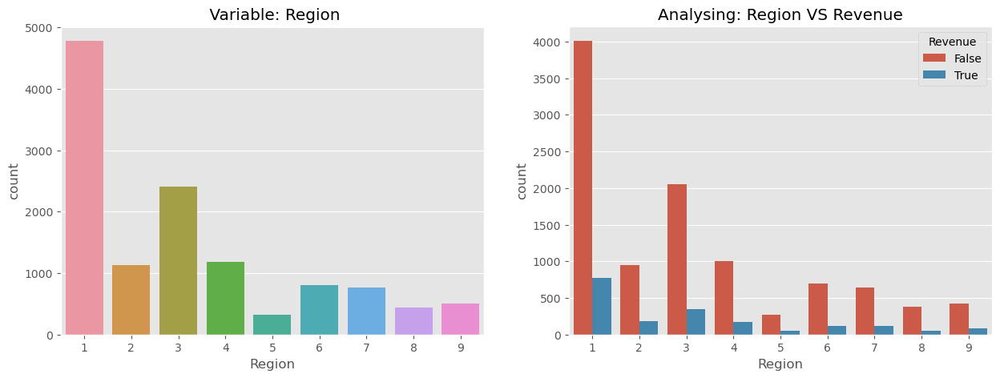

In [28]:
## Understanding which Region showed maximum revenue generation and visitors
data_plots('Region')

**Observation A:** Maximum visitors from Region 1,2, 3, 4 & Maximum revenue generation: Region 1 and 3.

**Observation B:** Minimum visitors from Region 5, 8, 9. & Minimum revenue generation: Region 5 and 8.

**E.TYPES OF VISITORS ANALYSIS**

Returning_Visitor    10551
New_Visitor           1694
Other                   85
Name: VisitorType, dtype: int64
Returning_Visitor    0.855718
New_Visitor          0.137388
Other                0.006894
Name: VisitorType, dtype: float64


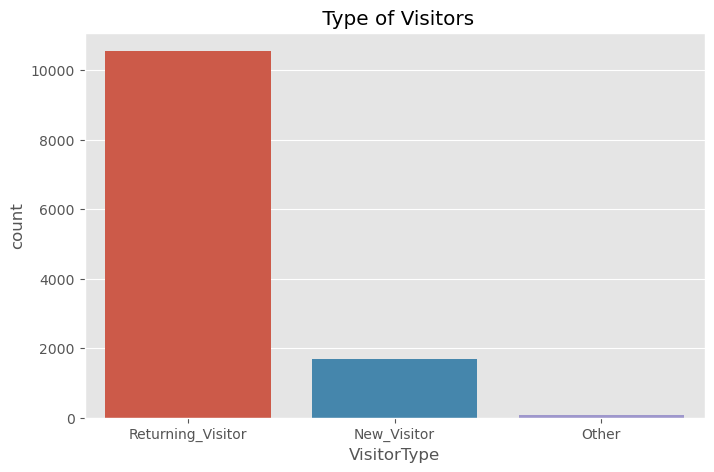

In [29]:
# Undersatnding the type of visitors in the acquired dataset

print(df['VisitorType'].value_counts())
print(df['VisitorType'].value_counts(normalize=True))
sns.countplot(df['VisitorType'])
plt.title(" Type of Visitors")
plt.show()

**Observation:** 

i. Around **85.5%** are returning visitors showing positive engagement of consumers.

ii. Around **13.73%** are new visitors showing lack of effective marketing startegies.

**F. OPERATING SYSTEM (OS) ANALYSIS**

In [30]:
## Understanding the presence of no.of operation systems in our acquired dataset.
print(df['OperatingSystems'].value_counts())
print(df['OperatingSystems'].value_counts(normalize=True))

2    6601
1    2585
3    2555
4     478
8      79
6      19
7       7
5       6
Name: OperatingSystems, dtype: int64
2    0.535361
1    0.209651
3    0.207218
4    0.038767
8    0.006407
6    0.001541
7    0.000568
5    0.000487
Name: OperatingSystems, dtype: float64


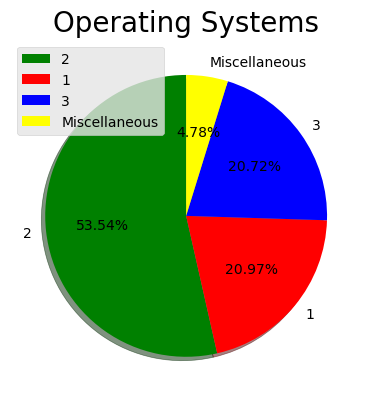

In [31]:
plt.rcParams['figure.figsize'] = (10, 6)
size = [6601, 2585, 2555, 589] # taken from value counts - as mentioned above
colors = ['green', 'red', 'blue', 'yellow']
labels = "2", "1", "3", "Miscellaneous" # as seen above they have the maximum amount of presence in Operating Systems

plt.subplot(1, 2, 2)
plt.pie(size, colors = colors, labels = labels, shadow = True, autopct = '%.2f%%', startangle=90)
plt.title('Operating Systems', fontsize = 20)
plt.axis('off')
plt.legend()
plt.show()

**Observation:** Top 3 Operating System (OS) are OS: 2 with **53.4%**, then OS: 1 with **20.97** and OS: 3 with **20.72%** performances and miscellanous OS needs to be looked into for improved performances by the company.

**G. MONTHLY REVENUE GENERATION ANALYISIS**

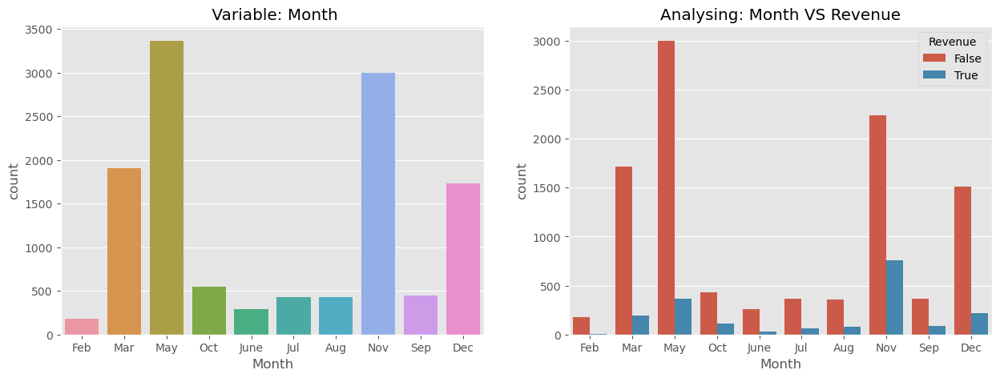

In [32]:
data_plots('Month')

**Observations:** 

Maximum Visitors: March, May, November and December 

Maximum Revenue generation: November ( then May)

Minimum Revenue generation: February 

**H. SPECIAL DAY AND REVENUE ANALYSIS**

In [33]:
print(df['SpecialDay'].value_counts())
print(df['SpecialDay'].value_counts(normalize=True))

0.0    11079
0.6      351
0.8      325
0.4      243
0.2      178
1.0      154
Name: SpecialDay, dtype: int64
0.0    0.898540
0.6    0.028467
0.8    0.026358
0.4    0.019708
0.2    0.014436
1.0    0.012490
Name: SpecialDay, dtype: float64


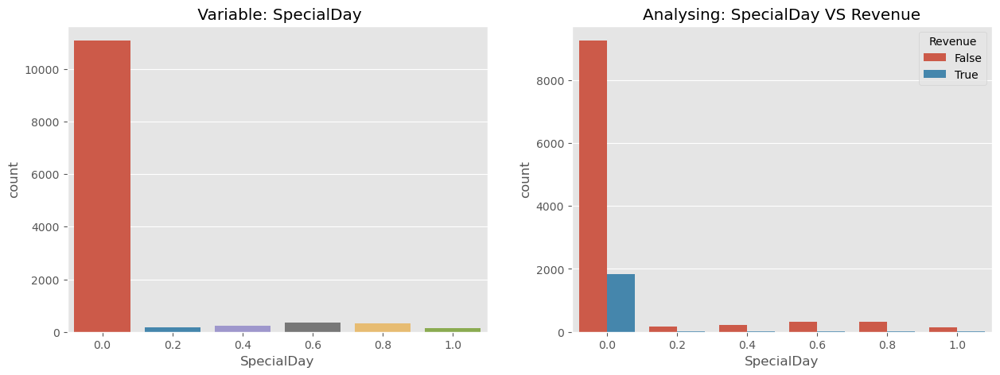

In [34]:
data_plots('SpecialDay')

**Observation** 89.8% of revenue generation happened on Non-Special Days, hence no special engagement or revenue was seen.

**CORRELATION ANALYSIS: BETWEEN TYPES OF DURATION and REVENUES ANALYSIS & THE AQUIRED DATASET**

**A. Administrative duration vs Revenue**

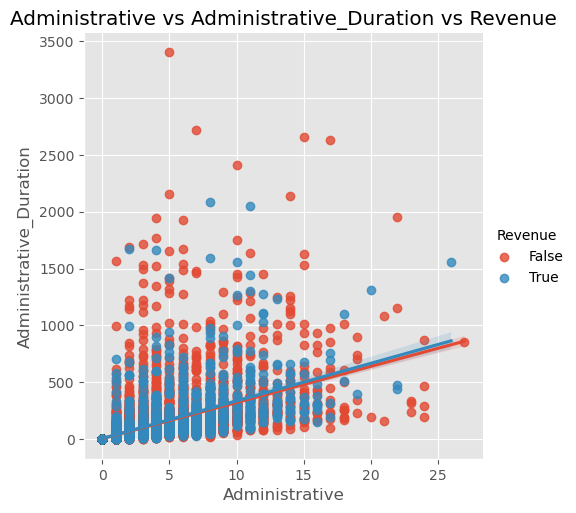

In [35]:
sns.lmplot('Administrative', 'Administrative_Duration', hue='Revenue', data=df)
plt.title("Administrative vs Administrative_Duration vs Revenue")
plt.show()

**B.Informational duration vs Revenue** 

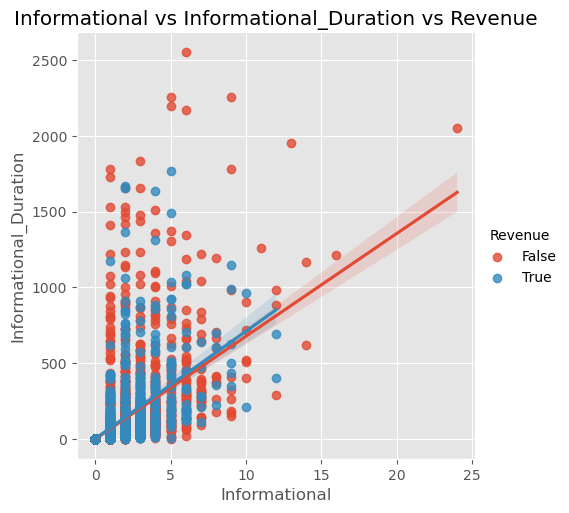

In [36]:
sns.lmplot('Informational', 'Informational_Duration', hue='Revenue', data=df)
plt.title("Informational vs Informational_Duration vs Revenue")
plt.show()

**C. PRODUCT RELATED DURATION AND REVENUE ANALYSIS** 

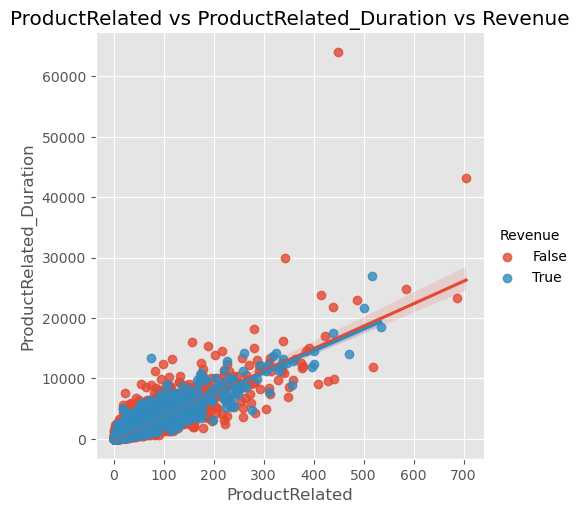

In [37]:
sns.lmplot('ProductRelated', 'ProductRelated_Duration', hue='Revenue', data=df)
plt.title("ProductRelated vs ProductRelated_Duration vs Revenue")
plt.show()

**Here we can observe** that Administrative Pages and Administrative Duration, Informational and Informational Duration, Product Related and Product Related Duration are positively correlated.Even though customers/visitors have spent a large amount of time on product related pages but the revenue generation is very low.

In [38]:
# Find all correlations and sort 
correlations_data = df.corr()['Revenue'].sort_values()
print(correlations_data.head(10), '\n') # Negative correlations
print(correlations_data.tail(10)) # Positive correlations

ExitRates                 -0.207071
BounceRates               -0.150673
SpecialDay                -0.082305
OperatingSystems          -0.014668
Region                    -0.011595
TrafficType               -0.005113
Browser                    0.023984
Weekend                    0.029295
Informational_Duration     0.070345
Administrative_Duration    0.093587
Name: Revenue, dtype: float64 

Browser                    0.023984
Weekend                    0.029295
Informational_Duration     0.070345
Administrative_Duration    0.093587
Informational              0.095200
Administrative             0.138917
ProductRelated_Duration    0.152373
ProductRelated             0.158538
PageValues                 0.492569
Revenue                    1.000000
Name: Revenue, dtype: float64


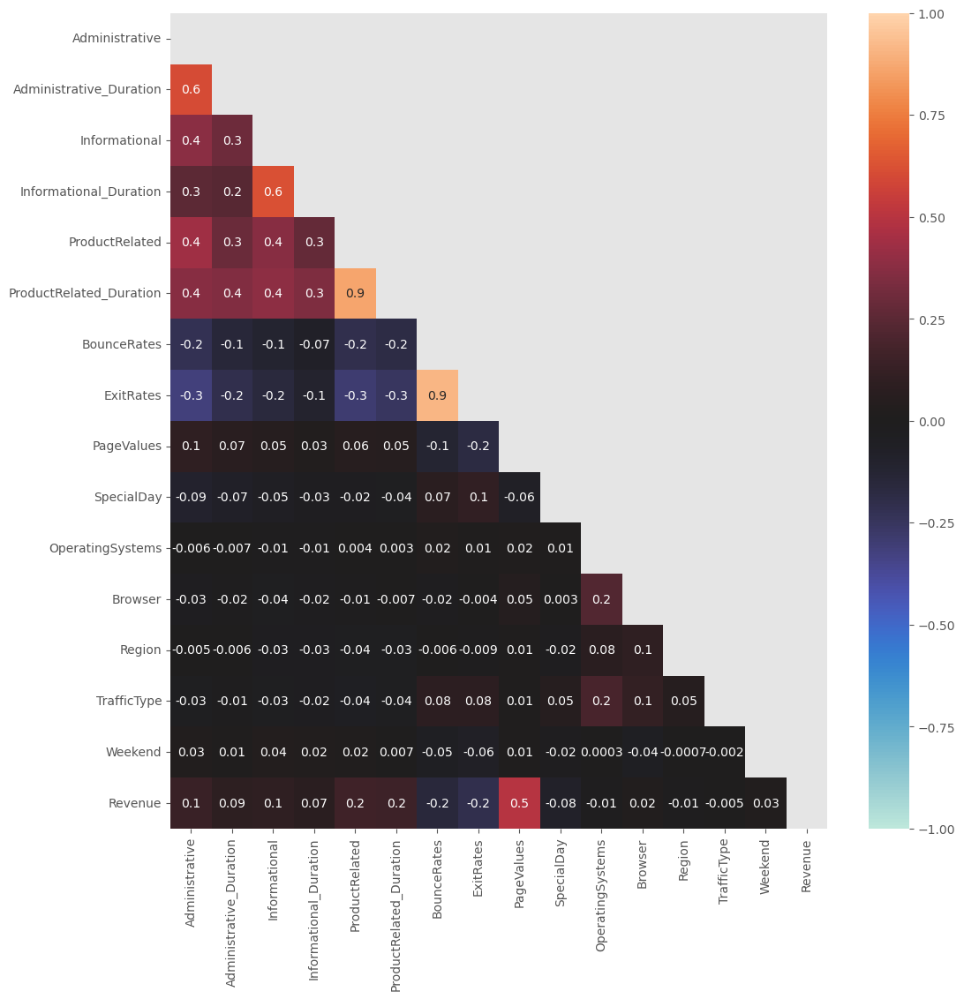

In [39]:
matrix = np.triu(df.corr())
fig, ax = plt.subplots(figsize=(12,12))
sns.heatmap(df.corr(), annot=True, ax=ax, fmt='.1g', vmin=-1, vmax=1, center= 0, mask=matrix)
plt.show()

**Observations** There is very little correlation among the different features in our dataset. 

1. High correlation (|corr| >= 0.7) are: BounceRates & ExitRates (0.9),ProductRelated & ProductRelated_Duration (0.9).

2. Moderate Correlations (0.3 < |corr| < 0.7): Administrative, Administrative_Duration, Informational, Informational_Duration, ProductRelated, and ProductRelated_Duration & PageValues and Revenue. 


### Step II: Predicting a machine learning model employing different methodologies to determine precise future values on customer online shopping intentions. 

In [29]:
dff = pd.concat([df,pd.get_dummies(df['Month'], prefix='Month')], axis=1).drop(['Month'],axis=1)
dff = pd.concat([dff,pd.get_dummies(dff['VisitorType'], prefix='VisitorType')], axis=1).drop(['VisitorType'],axis=1)
print(dff.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 29 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Administrative                 12330 non-null  int64  
 1   Administrative_Duration        12330 non-null  float64
 2   Informational                  12330 non-null  int64  
 3   Informational_Duration         12330 non-null  float64
 4   ProductRelated                 12330 non-null  int64  
 5   ProductRelated_Duration        12330 non-null  float64
 6   BounceRates                    12330 non-null  float64
 7   ExitRates                      12330 non-null  float64
 8   PageValues                     12330 non-null  float64
 9   SpecialDay                     12330 non-null  float64
 10  OperatingSystems               12330 non-null  int64  
 11  Browser                        12330 non-null  int64  
 12  Region                         12330 non-null 

In [31]:
dff.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,Month_Jul,Month_June,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,VisitorType_New_Visitor,VisitorType_Other,VisitorType_Returning_Visitor
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,...,0,0,0,0,0,0,0,0,0,1


In [32]:
# Splitting the data set
y = dff['Revenue']
X = dff.drop(['Revenue'], axis=1)

In [33]:
X_train, X_valtest, y_train, y_valtest = train_test_split(X, y, test_size=0.3, random_state=101)
X_val, X_test, y_val, y_test = train_test_split(X_valtest, y_valtest, test_size=0.5, random_state=101)

In [34]:
sc_X = StandardScaler()
# Will be useful for feature scaling in future
Xsc_train = sc_X.fit_transform(X_train)
Xsc_val = sc_X.fit_transform(X_val)
Xsc_test = sc_X.fit_transform(X_test)

### MODELING

In [35]:
#Importing required libraries

from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier

#### Logistic Regression

In [36]:
lrm = LogisticRegression(C=1.0,solver='lbfgs',) #default parameters
lrm.fit(X_train,y_train)
lrm_pred = lrm.predict(X_val)

print('Logistic Regression initial Performance:')
print('----------------------------------------')
print('Accuracy        : ', metrics.accuracy_score(y_val, lrm_pred))
print('F1 Score        : ', metrics.f1_score(y_val, lrm_pred))
print('Precision       : ', metrics.precision_score(y_val, lrm_pred))
print('Recall          : ', metrics.recall_score(y_val, lrm_pred))
print('Confusion Matrix:\n ', confusion_matrix(y_val, lrm_pred))

Logistic Regression initial Performance:
----------------------------------------
Accuracy        :  0.8788534342888048
F1 Score        :  0.5313807531380752
Precision       :  0.7470588235294118
Recall          :  0.41233766233766234
Confusion Matrix:
  [[1498   43]
 [ 181  127]]


#### Random Forest

In [37]:
rfm = RandomForestClassifier(n_estimators=100,
    criterion='gini',
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features='auto',
    bootstrap=True) #default parameters
rfm.fit(X_train,y_train)
rfm_pred = rfm.predict(X_val)

print('Random Forest initial Performance:')
print('----------------------------------')
print('Accuracy        : ', metrics.accuracy_score(y_val, rfm_pred))
print('F1 Score        : ', metrics.f1_score(y_val, rfm_pred))
print('Precision       : ', metrics.precision_score(y_val, rfm_pred))
print('Recall          : ', metrics.recall_score(y_val, rfm_pred))
print('Confusion Matrix:\n ', confusion_matrix(y_val, rfm_pred))

Random Forest initial Performance:
----------------------------------
Accuracy        :  0.9048134126554894
F1 Score        :  0.6752767527675276
Precision       :  0.782051282051282
Recall          :  0.5941558441558441
Confusion Matrix:
  [[1490   51]
 [ 125  183]]


#### K-Nearest Neighbor Classification

In [38]:
knn = KNeighborsClassifier(n_neighbors=5,weights='uniform',leaf_size=30,p=2) #default values
knn.fit(Xsc_train,y_train)
knn_pred = knn.predict(Xsc_val)

print('K-Nearest Neighbor Initial Performance:')
print('---------------------------------------')
print('Accuracy        : ', metrics.accuracy_score(y_val, knn_pred))
print('F1 Score        : ', metrics.f1_score(y_val, knn_pred))
print('Precision       : ', metrics.precision_score(y_val, knn_pred))
print('Recall          : ', metrics.recall_score(y_val, knn_pred))
print('Confusion Matrix:\n ', confusion_matrix(y_val, knn_pred))

K-Nearest Neighbor Initial Performance:
---------------------------------------
Accuracy        :  0.8734451054624122
F1 Score        :  0.5021276595744681
Precision       :  0.7283950617283951
Recall          :  0.38311688311688313
Confusion Matrix:
  [[1497   44]
 [ 190  118]]


#### SUPPORT VECTOR MACHINE

In [39]:
svm = SVC(C=1.0,kernel='rbf',degree=3,gamma='scale') #default values
svm.fit(Xsc_train,y_train)
svm_pred = svm.predict(Xsc_val)

print('SVM Initial Performance:')
print('------------------------')
print('Accuracy        : ', metrics.accuracy_score(y_val, svm_pred))
print('F1 Score        : ', metrics.f1_score(y_val, svm_pred))
print('Precision       : ', metrics.precision_score(y_val, svm_pred))
print('Recall          : ', metrics.recall_score(y_val, svm_pred))
print('Confusion Matrix:\n ', confusion_matrix(y_val, svm_pred))

SVM Initial Performance:
------------------------
Accuracy        :  0.8875067604110329
F1 Score        :  0.5856573705179283
Precision       :  0.7577319587628866
Recall          :  0.4772727272727273
Confusion Matrix:
  [[1494   47]
 [ 161  147]]


#### NAIVE BAYE'S THEORM 

In [40]:
from sklearn.naive_bayes import GaussianNB
nbm = GaussianNB()
nbm.fit(X_train,y_train)
nbm_pred = nbm.predict(X_val)

print('Gaussian Naive Bayes Performance:')
print('---------------------------------')
print('Accuracy        : ', metrics.accuracy_score(y_val, nbm_pred))
print('F1 Score        : ', metrics.f1_score(y_val, nbm_pred))
print('Precision       : ', metrics.precision_score(y_val, nbm_pred))
print('Recall          : ', metrics.recall_score(y_val, nbm_pred))
print('Confusion Matrix:\n ', confusion_matrix(y_val, nbm_pred))

Gaussian Naive Bayes Performance:
---------------------------------
Accuracy        :  0.775013520822066
F1 Score        :  0.4914425427872861
Precision       :  0.3941176470588235
Recall          :  0.6525974025974026
Confusion Matrix:
  [[1232  309]
 [ 107  201]]


#### GRADIENT BOOSTER

In [41]:
gbm = GradientBoostingClassifier(loss='deviance',
    learning_rate=0.1,
    n_estimators=100,
    subsample=1.0,
    criterion='friedman_mse',
    min_samples_split=2,
    min_samples_leaf=1,
    max_depth=3,
    max_features=None) #default parameters
gbm.fit(X_train,y_train)
gbm_pred = gbm.predict(X_val)

print('Gradient Boost initial Performance:')
print('-----------------------------------')
print('Accuracy        : ', metrics.accuracy_score(y_val, gbm_pred))
print('F1 Score        : ', metrics.f1_score(y_val, gbm_pred))
print('Precision       : ', metrics.precision_score(y_val, gbm_pred))
print('Recall          : ', metrics.recall_score(y_val, gbm_pred))
print('Confusion Matrix:\n ', confusion_matrix(y_val, gbm_pred))

Gradient Boost initial Performance:
-----------------------------------
Accuracy        :  0.9053542455381287
F1 Score        :  0.6891651865008881
Precision       :  0.7607843137254902
Recall          :  0.6298701298701299
Confusion Matrix:
  [[1480   61]
 [ 114  194]]


**OBSERVATIONS FROM MODEL CREATION:**

In comparison to SVM, the default logistic regression classifier produced lower accuracy and F1 scores. The initial SVM model significantly improved all performance indicators when compared to KNN.
In comparison to all other classifiers we have evaluated so far, the random forest classifier (with default parameter values) provides us with a greater accuracy and F1 score. 
The default classification performance of gradient boosting is better than that of random forest.

**METRICS FORMATION**

| Classifier | Accuracy | F1-Score | Precision | Recall |
|:-----------|:---------|:---------|:----------|:-------|
|Logistic Regression|0.879|0.53|0.74|0.41|
|Random Forest|0.89|0.66|0.75|0.58|                    
|KNN|0.87|0.50|0.72|0.38|
|SVM|0.88|0.58|0.75|0.47|
|Gradient Booster|0.90|0.68|0.76|0.62|
|NB|0.77|0.49|0.39|0.65|

**ROC CURVE**

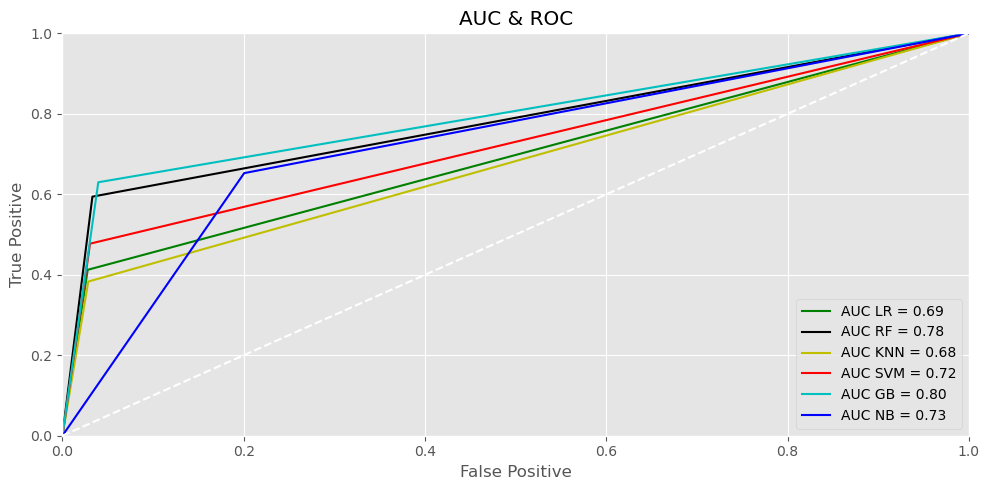

In [43]:
fpr_knn, tpr_knn, threshold_knn = metrics.roc_curve(y_val, knn_pred)
roc_auc_knn = metrics.auc(fpr_knn, tpr_knn)
fpr_svm, tpr_svm, threshold_svm = metrics.roc_curve(y_val, svm_pred)
roc_auc_svm = metrics.auc(fpr_svm, tpr_svm)
fpr_lrm, tpr_lrm, threshold_lrm = metrics.roc_curve(y_val, lrm_pred)
roc_auc_lrm = metrics.auc(fpr_lrm, tpr_lrm)
fpr_rfm, tpr_rfm, threshold_rfm = metrics.roc_curve(y_val, rfm_pred)
roc_auc_rfm = metrics.auc(fpr_rfm, tpr_rfm)
fpr_nb, tpr_nb, threshold_nb = metrics.roc_curve(y_val, nbm_pred)
roc_auc_nb = metrics.auc(fpr_nb, tpr_nb)
fpr_gbm, tpr_gbm, threshold_gbm = metrics.roc_curve(y_val, gbm_pred)
roc_auc_gbm = metrics.auc(fpr_gbm, tpr_gbm)

fig = plt.figure(figsize=(10, 5))
plt.title('AUC & ROC')
plt.plot(fpr_lrm, tpr_lrm, 'g', label = 'AUC LR = %0.2f' % roc_auc_lrm)
plt.plot(fpr_rfm, tpr_rfm, 'k', label = 'AUC RF = %0.2f' % roc_auc_rfm)
plt.plot(fpr_knn, tpr_knn, 'y', label = 'AUC KNN = %0.2f' % roc_auc_knn)
plt.plot(fpr_svm, tpr_svm, 'r', label = 'AUC SVM = %0.2f' % roc_auc_svm)
plt.plot(fpr_gbm, tpr_gbm, 'c', label = 'AUC GB = %0.2f' % roc_auc_gbm)
plt.plot(fpr_nb, tpr_nb, 'b', label = 'AUC NB = %0.2f' % roc_auc_nb)

plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'w--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive')
plt.xlabel('False Positive')
plt.tight_layout()
plt.show()

**Observation:** We can see that fromall the above calculated classification metrics shows **Gradient Booster** classifier with the best level of accuracy. Followed by Random Forest and at last Support Vector Machine (SVM) model.